In [68]:
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
import os
import numpy as np
from pycocotools.coco import COCO
from PIL import Image
import matplotlib.pyplot as plt
from skimage import io

In [7]:
img_dir = 'data/dfg_data'
coco_file = 'data/dfg_data/filtered.json'

In [8]:
coco = COCO(coco_file)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [93]:
images = coco.getImgIds()
image_files = [i['file_name'] for i in coco.loadImgs(images)]
_id_to_file = {i: f for i, f in zip(images, image_files)}


def get_image(_id):
    return io.imread(os.path.join(img_dir, _id_to_file[_id]))


def random_image():
    _id = np.random.choice(images)
    return _id, get_image(_id)


def get_bounding_boxes(_id, img):
    anns = coco.getAnnIds(imgIds=_id)
    anns = coco.loadAnns(anns)
    bbs = [BoundingBox(x['bbox'][0], x['bbox'][1], x['bbox'][0] +
                       x['bbox'][2], x['bbox'][1] + x['bbox'][3]) for x in anns]
    return BoundingBoxesOnImage(bbs, shape=img.shape)


def test_augmentation(aug: iaa.Augmenter, title: str = 'Augmentation', img=None, bbs=None):
    if img is None or bbs is None:
        _id, img = random_image()
        bbs = get_bounding_boxes(_id, img)
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.title('Original')
    plt.imshow(bbs.draw_on_image(np.array(img), size=8))
    plt.subplot(1, 2, 2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
    plt.savefig('examples/'+title + '.jpg', dpi=300, bbox_inches='tight')
    plt.show()

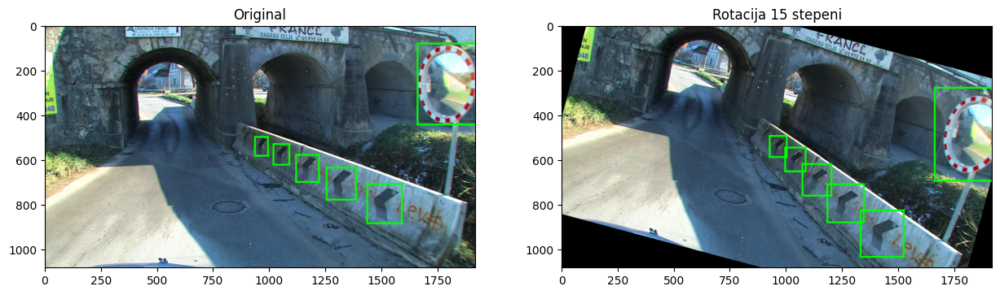

In [97]:
rotate = iaa.Rotate(rotate=15)
test_augmentation(rotate, 'Rotacija 15 stepeni')

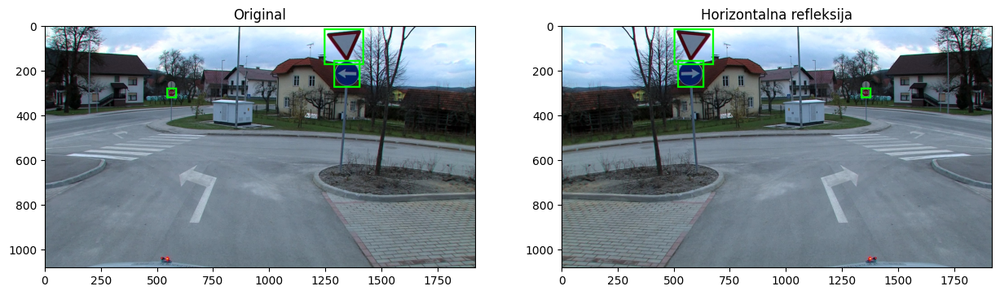

In [98]:
flip = iaa.Fliplr(1.0)
test_augmentation(flip, 'Horizontalna refleksija')

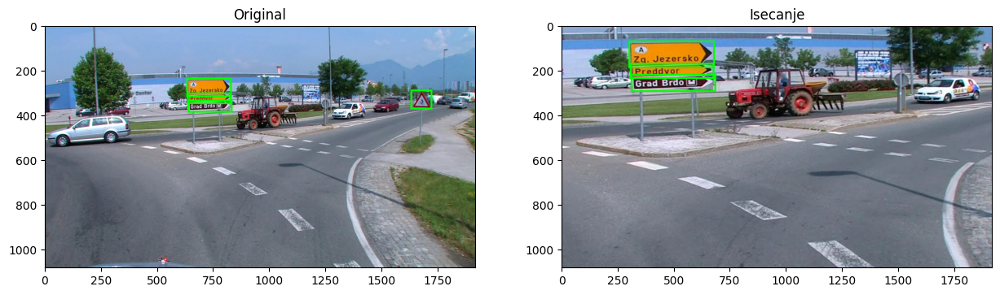

In [105]:
crop = iaa.Crop(percent=(0.1, 0.3))
test_augmentation(crop, 'Isecanje')

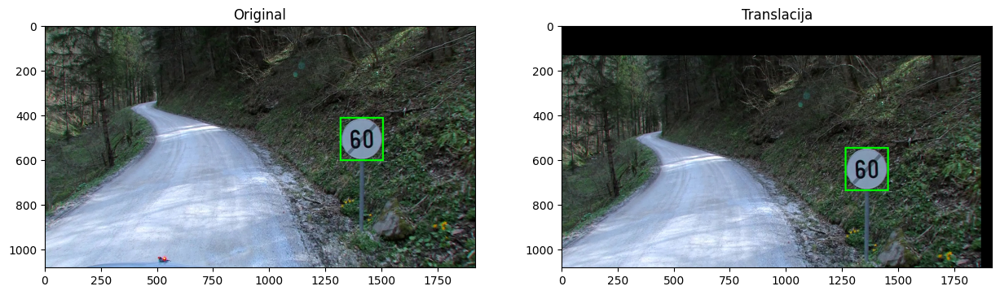

In [106]:
translate = iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)})
test_augmentation(translate, 'Translacija')

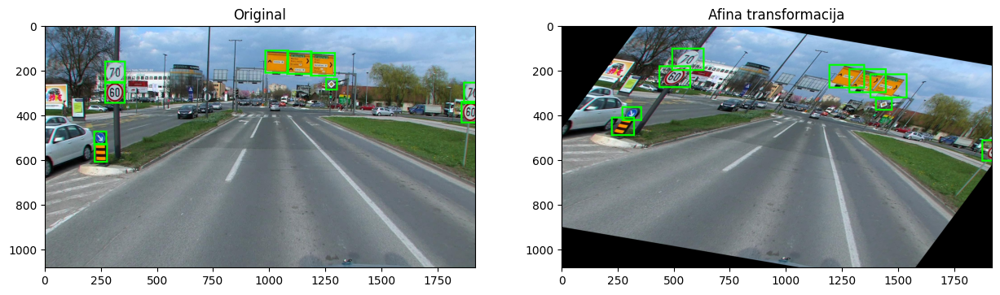

In [118]:
affine = iaa.Affine(scale=(0.5, 1.5), rotate=(-15, 15), shear=27)
test_augmentation(affine, 'Afina transformacija')

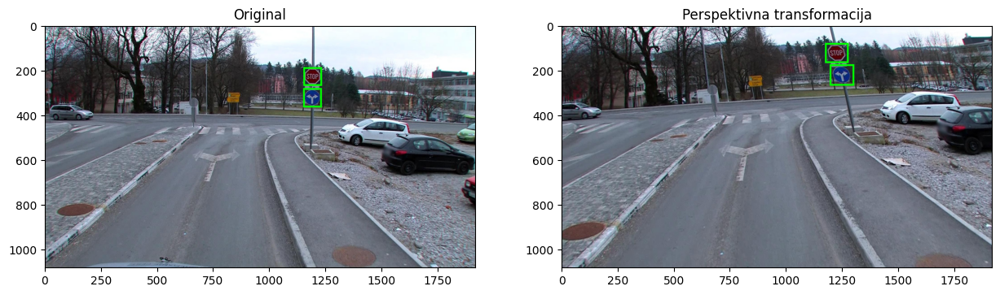

In [136]:
perspective = iaa.PerspectiveTransform(scale=0.1)
test_augmentation(perspective, 'Perspektivna transformacija')

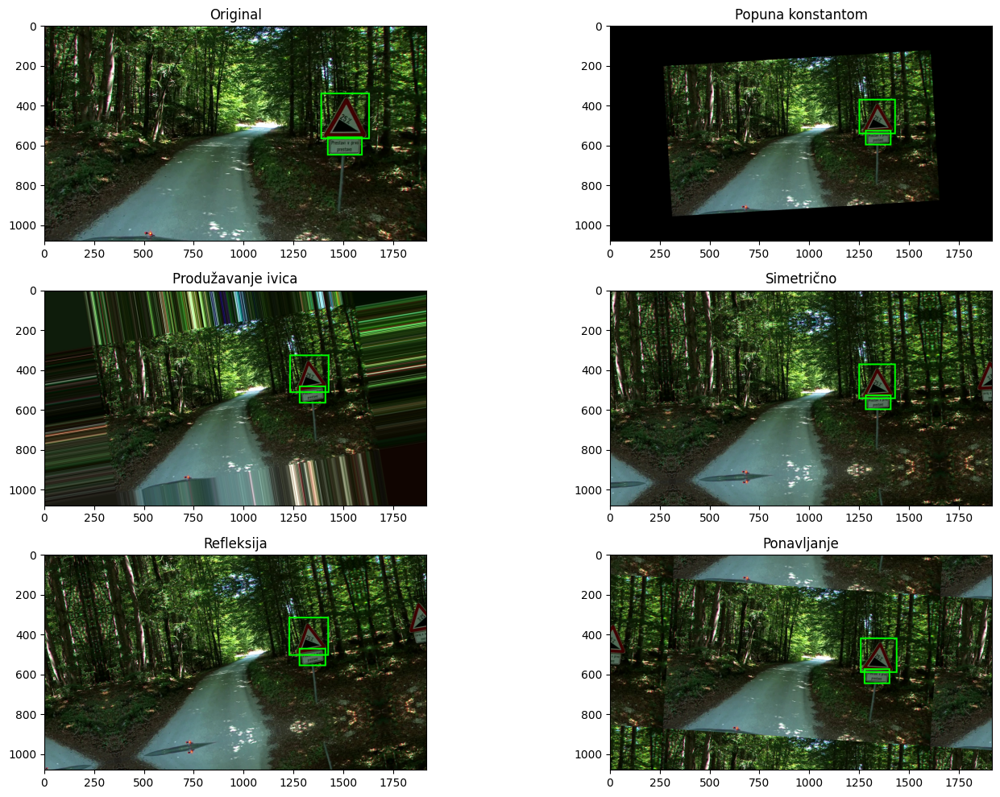

In [139]:

_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 10))
plt.subplot(3, 2, 1)
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
plt.title('Original')
modovi = ['Popuna konstantom', 'Produžavanje ivica',
          'Simetrično', 'Refleksija', 'Ponavljanje']
for i, mode in enumerate(['constant', 'edge', 'symmetric', 'reflect', 'wrap']):
    aug = iaa.Affine(scale=0.7, rotate=(-15, 15), mode=mode)
    plt.subplot(3, 2, i+2)
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.imshow(bbs_aug.draw_on_image(np.array(img_aug), size=8))
    plt.title(modovi[i])
plt.tight_layout()
plt.savefig('examples/Border_modes.jpg', dpi=300, bbox_inches='tight')
plt.show()

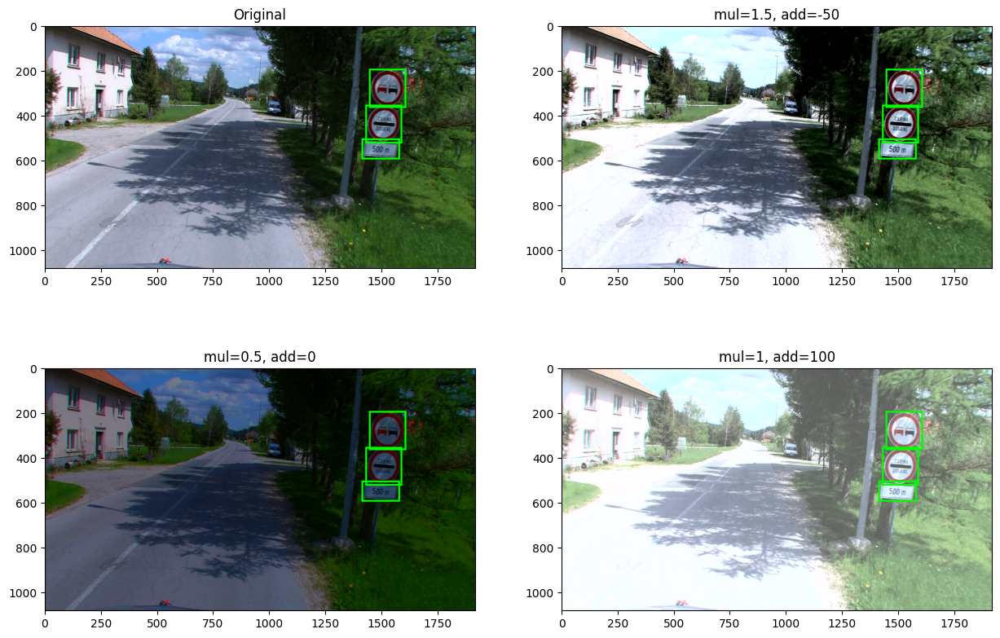

In [12]:
brightness1 = iaa.MultiplyAndAddToBrightness(mul=1.5, add=-10)
brightness2 = iaa.MultiplyAndAddToBrightness(mul=0.5, add=0)
brightness3 = iaa.MultiplyAndAddToBrightness(mul=1, add=100)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([brightness1, brightness2, brightness3],
        ['mul=1.5, add=-50', 'mul=0.5, add=0', 'mul=1, add=100'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(2, 2, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'brightness' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()

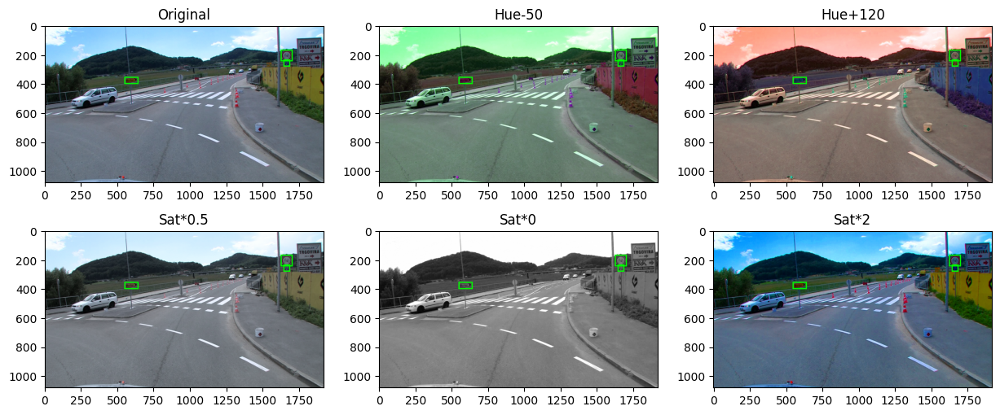

In [15]:
aug1 = iaa.AddToHue(-50)
aug2 = iaa.AddToHue(120)
aug3 = iaa.MultiplySaturation(0.5)
aug4 = iaa.MultiplySaturation(0)
aug5 = iaa.MultiplySaturation(2)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 6))
plt.subplot(2, 3, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([aug1, aug2, aug3, aug4, aug5],
        ['Hue-50', 'Hue+120', 'Sat*0.5', 'Sat*0', 'Sat*2'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(2, 3, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'huesat' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()

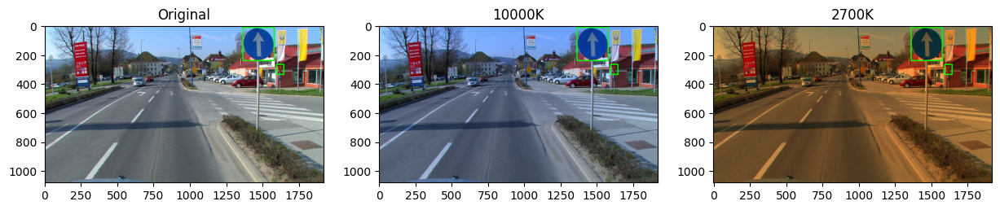

In [17]:
aug1 = iaa.ChangeColorTemperature(10000)
aug2 = iaa.ChangeColorTemperature(2700)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([aug1, aug2],
        ['10000K', '2700K'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(1, 3, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'temp' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()

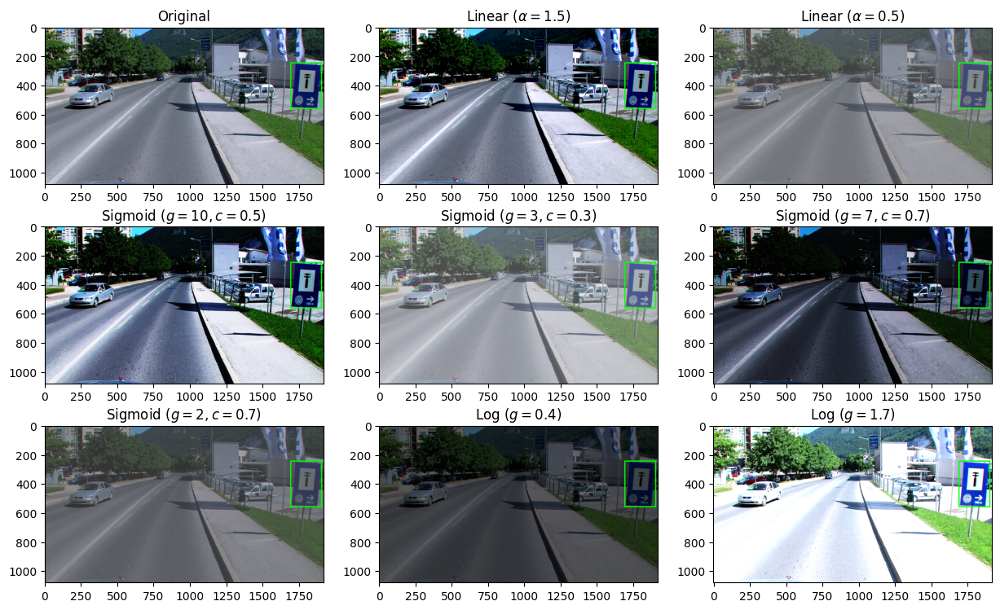

In [18]:
aug1 = iaa.LinearContrast(1.5)
aug2 = iaa.LinearContrast(0.5)
aug3 = iaa.SigmoidContrast(gain=10, cutoff=0.5)
aug4 = iaa.SigmoidContrast(gain=3, cutoff=0.3)
aug5 = iaa.SigmoidContrast(gain=7, cutoff=0.7)
aug6 = iaa.SigmoidContrast(gain=2, cutoff=0.7)
aug7 = iaa.LogContrast(gain=0.4)
aug8 = iaa.LogContrast(gain=1.7)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 9))
plt.subplot(3, 3, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([aug1, aug2, aug3, aug4, aug5, aug6, aug7, aug8],
        ['Linear ($\\alpha=1.5$)', 'Linear ($\\alpha=0.5$)', 'Sigmoid ($g=10, c=0.5$)', 'Sigmoid ($g=3, c=0.3$)', 'Sigmoid ($g=7, c=0.7$)', 'Sigmoid ($g=2, c=0.7$)', 'Log ($g=0.4$)', 'Log ($g=1.7$)'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(3, 3, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'contrast' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()

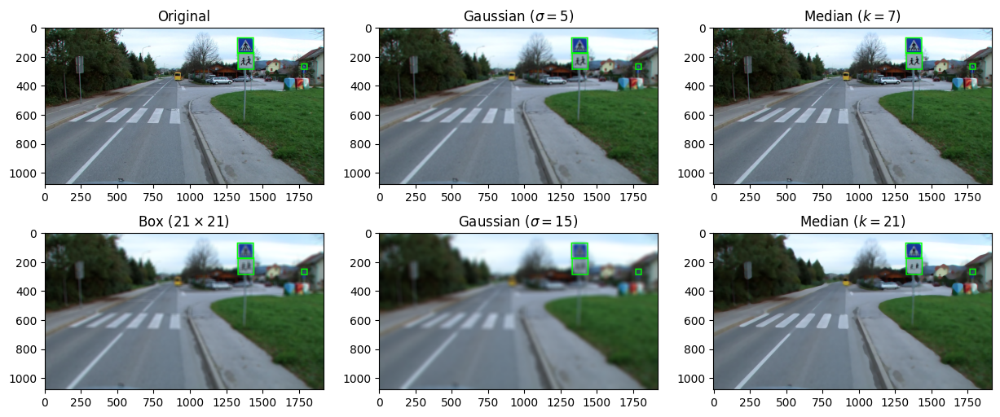

In [23]:
aug1 = iaa.GaussianBlur(sigma=5)
aug2 = iaa.MedianBlur(k=7)
aug3 = iaa.Convolve(matrix=np.ones((21, 21))/(21*21))
aug4 = iaa.GaussianBlur(sigma=15)
aug5 = iaa.MedianBlur(k=21)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 6))
plt.subplot(2, 3, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([aug1, aug2, aug3, aug4, aug5],
        ['Gaussian ($\\sigma=5$)', 'Median ($k=7$)', 'Box ($21\\times21$)', 'Gaussian ($\\sigma=15$)', 'Median ($k=21$)'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(2, 3, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'blur' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()

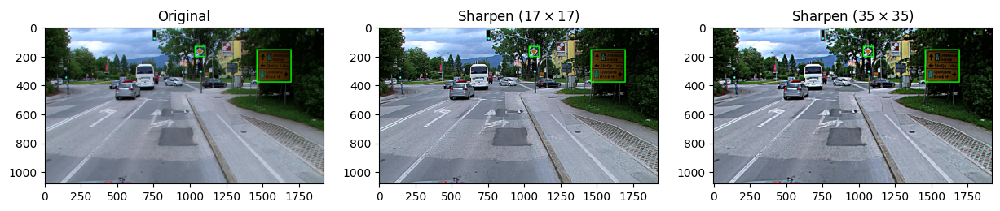

In [33]:
sharpen_kernel_35 = np.zeros((35, 35))
sharpen_kernel_35[17, 17] = 2
sharpen_kernel_35 -= 1/(35*35)
sharpen_kernel_17 = np.zeros((17, 17))
sharpen_kernel_17[8, 8] = 2
sharpen_kernel_17 -= 1/289
aug1 = iaa.Convolve(matrix=sharpen_kernel_17)
aug2 = iaa.Convolve(matrix=sharpen_kernel_35)
_id, img = random_image()
bbs = get_bounding_boxes(_id, img)
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(bbs.draw_on_image(np.array(img), size=8))
for i, (aug, title) in enumerate(
    zip([aug1, aug2],
        ['Sharpen ($17\\times17$)', 'Sharpen ($35\\times35$)'])):
    img_aug, bbs_aug = aug(image=img, bounding_boxes=bbs)
    plt.subplot(1, 3, i+2)
    plt.imshow(bbs_aug.draw_on_image(
        np.array(img_aug), size=8))
    plt.title(title)
plt.savefig('examples/'+'sharpen' + '.jpg', dpi=300, bbox_inches='tight')
plt.show()